In [1]:
import numpy as np 
from scipy.optimize import *

import matplotlib.pyplot as plt
import seaborn as sns

from parameters import *
from models.game_theory_model import *
from models.game import *
from plot_function import *

sns.set_style('ticks',  {"axes.grid" : "True", "grid.color": ".4", "grid.linestyle": ":"})
sns.set_context('paper')
plt.rcParams.update({'mathtext.default':  'regular' })
plt.rcParams['xtick.direction'] = 'out'
plt.rcParams['ytick.labelsize']  =15
plt.rcParams['xtick.labelsize']  =15
plt.rcParams['legend.fontsize']  = 16
plt.rcParams['axes.labelsize' ] = 16
plt.rcParams['font.size'] = 16
plt.rcParams['axes.titlesize'] = 16
plt.rcParams['axes.formatter.useoffset'] = False

from ipywidgets import interact, interactive, fixed, interact_manual
from ipywidgets import *
import ipywidgets as widgets
from functools import partial
from IPython.display import display, Math, Latex
from tqdm import tqdm
from scipy.spatial import ConvexHull
from termcolor import colored

In [2]:

def benefit_econmical_shape_( GDP_max, e_max, saving_rate = 0.25,  sigma = 0.16):
    x = np.linspace(0, e_max)
    rho = (sigma -1)/sigma
    capital =  GDP_max * saving_rate
    CO2_intensity = GDP_max/e_max
    plt.plot(x, (capital**rho + (CO2_intensity * x + 0.01)**rho)**(1/rho) )
    print(CO2_intensity)

interact(benefit_econmical_shape_,  GDP_max=50, e_max =11, saving_rate=(0,1,0.02),sigma=(0.01,0.98,0.01))

interactive(children=(IntSlider(value=50, description='GDP_max', max=150, min=-50), IntSlider(value=11, descri…

<function __main__.benefit_econmical_shape_(GDP_max, e_max, saving_rate=0.25, sigma=0.16)>

In [10]:
names = ['p1', 'p2']
action_set = np.vstack((ACTION_SETS[0], np.sum(ACTION_SETS[1:], axis=0)*2)) 
@widgets.interact( beta_0_1=FloatSlider(min= 0, max= 100, step = 1, name=r'$\beta_{0,1}$',  description_allow_html=True), beta_1_1=(-10,10,0.1), beta_2_1=(-1,1,0.005),
                          beta_0_2=(0,100,0.1), beta_1_2=(-10,10,0.1), beta_2_2=(-1,1,0.005),
                          w_1=(0,10,0.1), w_2=(0,10,0.1),
                          gamma_0=(-10,10,0.1), gamma_1=(-10,10,0.1), gamma_2=(-5,5,0.01),gamma_3=(-10,10,0.1),
                        carbon_multiplier = (1,5,0.5), temp_multiplier = (1,5,0.5))
def game_two_player(beta_0_1, beta_1_1, beta_2_1, beta_0_2, beta_1_2, beta_2_2, w_1, w_2, gamma_0, gamma_1, gamma_2, gamma_3):
    list_benefit_functions = [partial(benefit_polynome, coef=[beta_0_1, beta_1_1, beta_2_1]), partial(benefit_polynome, coef=[beta_0_2, beta_1_2, beta_2_2])]
    Gdp = np.vstack((list_benefit_functions[0](0,0)(action_set[0,1]), list_benefit_functions[1](0,0)(action_set[1,1])))

    damage_coef = [gamma_0, gamma_1, gamma_2, gamma_3]
    list_deltas = [w_1, w_2]
    list_players = create_players(list_of_names=names, list_action_sets=action_set, list_GDP_initial=Gdp,
                                   list_deltas=list_deltas, list_benefit_functions=list_benefit_functions,
                                   list_coef_increase_co2 = [0,0], list_percentage_green = [0,0], damage_in_percentage= True,
                                       damage_function=damage_polynome(damage_coef), discount=1)


    game = Game(list_players, horizon=2020)
    utilities = np.array([0,0])
    for a_1 in np.linspace(*action_set[0],80, endpoint=True):
        for a_2 in np.linspace(*action_set[1],80, endpoint=True):

           utilities = np.vstack((utilities, game.one_shot_game_with_strategies_profile(array_action=np.array([a_1, a_2]), sum_action=a_1+a_2 )))
    game.one_shot_game_NE()
    #game.one_shot_game_SO()

    # display(Markdown(r'u_1(x,a) = {}a_1^2 + {}a_1 + {} - ({}\theta_{{AT}}^2 + {}\theta_{{AT}} + {})'.format(beta_2_1, beta_1_1, beta_0_1, gamma_2, gamma_1, gamma_0)))
    print(game.ne_a_p)
    # print(2 * beta_2_1 *np.linspace(*action_set[0],100, endpoint=True) + beta_1_1)
    # print(2 * beta_2_2 *np.linspace(*action_set[1],100, endpoint=True) + beta_1_2)

    ne_1, ne_2 = game.ne_u_p
    #so_1, so_2 = game.so_u_p

    if (2 * beta_2_1 * action_set[0,1] + beta_1_1) < 0 or  (2 * beta_2_2 * action_set[1,1] + beta_1_2) < 0 :
        plt.scatter(utilities[1:,0],utilities[1:,1], marker='.', color='red' )
    else :
        plt.scatter(utilities[1:,0],utilities[1:,1])

    # plt.contour(utilities[1:,0],utilities[1:,1])
    plt.scatter(ne_1,ne_2, marker='X' )
    #plt.scatter(so_1,so_2, marker='X' )

    X = 2020 + np.arange(game.T)*5


interactive(children=(FloatSlider(value=0.0, description='beta_0_1', step=1.0), FloatSlider(value=0.0, descrip…

In [ ]:
names = ['p1', 'p2']
action_set = np.vstack((ACTION_SETS[0], np.sum(ACTION_SETS[1:], axis=0)*2)) 
Gdp = np.vstack((GDP_MAX[0], np.sum(GDP_MAX[1:], axis=0)))
@widgets.interact( beta_0_1=FloatSlider(min= -10, max= 10, step = 0.1, name=r'$\beta_{0,1}$',  description_allow_html=True), beta_1_1=(-10,10,0.1), beta_2_1=(-1,1,0.01),
                          beta_0_2=(-10,10,0.1), beta_1_2=(-10,10,0.1), beta_2_2=(-1,1,0.01),
                          w_1=(0,10,0.1), w_2=(0,10,0.1),
                          gamma_0=(-10,10,0.1), gamma_1=(-10,10,0.1), gamma_2=(-10,10,0.1),gamma_3=(-10,10,0.1),
                        carbon_multiplier = (1,5,0.5), temp_multiplier = (1,5,0.5))
def game_two_player(beta_0_1, beta_1_1, beta_2_1, beta_0_2, beta_1_2, beta_2_2, w_1, w_2, gamma_0, gamma_1, gamma_2, gamma_3):
    list_benefit_functions = [partial(benefit_polynome, coef=[beta_0_1, beta_1_1, beta_2_1]), partial(benefit_polynome, coef=[beta_0_2, beta_1_2, beta_2_2])]
    damage_coef = [gamma_0, gamma_1, gamma_2, gamma_3]
    list_deltas = [w_1, w_2]
    list_players = create_players(list_of_names=names, list_action_sets=action_set, list_GDP_initial=Gdp,
                                   list_deltas=list_deltas, list_benefit_functions=list_benefit_functions,
                                   list_coef_increase_co2 = [0,0], list_percentage_green = [0,0], damage_in_percentage= False,
                                       damage_function=damage_polynome(damage_coef), discount=1)


    game = Game(list_players, horizon=2100)
    utilities = np.array([0,0])
    for a_1 in np.linspace(*action_set[0],100, endpoint=True):
        for a_2 in np.linspace(*action_set[1],100, endpoint=True):

           utilities = np.vstack((utilities, game.one_shot_game_with_strategies_profile(array_action=np.array([a_1, a_2]), sum_action=a_1+a_2 )))
    game.one_shot_game_NE()
    # display(Markdown(r'u_1(x,a) = {}a_1^2 + {}a_1 + {} - ({}\theta_{{AT}}^2 + {}\theta_{{AT}} + {})'.format(beta_2_1, beta_1_1, beta_0_1, gamma_2, gamma_1, gamma_0)))
    print(game.ne_a_p)
    # print(2 * beta_2_1 *np.linspace(*action_set[0],100, endpoint=True) + beta_1_1)
    # print(2 * beta_2_2 *np.linspace(*action_set[1],100, endpoint=True) + beta_1_2)

    ne_1, ne_2 = game.ne_u_p
    if (2 * beta_2_1 * action_set[0,1] + beta_1_1) < 0 or  (2 * beta_2_2 * action_set[1,1] + beta_1_2) < 0 :
        plt.scatter(utilities[1:,0],utilities[1:,1], marker='.', color='red' )
    else :
        plt.scatter(utilities[1:,0],utilities[1:,1], marker='.')

    # plt.contour(utilities[1:,0],utilities[1:,1])
    plt.scatter(ne_1,ne_2, marker='X' )
    X = 2020 + np.arange(game.T)*5

26.13

In [ ]:
widgets.interact(game_two_player, beta_0_1=FloatSlider(min= -10, max= 10, step = 0.1, name=r'$\beta_{0,1}$',  description_allow_html=True), beta_1_1=(-10,10,0.1), beta_2_1=(-1,1,0.01),
                          beta_0_2=(-10,10,0.1), beta_1_2=(-10,10,0.1), beta_2_2=(-1,1,0.01),
                          w_1=(0,10,0.1), w_2=(0,10,0.1),
                          gamma_0=(-10,10,0.1), gamma_1=(-10,10,0.1), gamma_2=(-10,10,0.1), carbon_multiplier = (1,5,0.5), temp_multiplier = (1,5,0.5))



interactive(children=(FloatSlider(value=0.0, description='beta_0_1', max=10.0, min=-10.0), FloatSlider(value=0…

<function __main__.game_two_player(beta_0_1, beta_1_1, beta_2_1, beta_0_2, beta_1_2, beta_2_2, w_1, w_2, gamma_0, gamma_1, gamma_2)>

In [14]:
    print(' \033[93m hello')


  hello


In [6]:
np.log2(800/C_1750)/(800/C_1750)

0.3212816088792318

In [18]:
TEMPERATURE_MODEL.bt @ TEMPERATURE_MODEL.dt  * 3.7  /np.log(2)

2.0128745333312024

In [19]:
CARBON_MODEL.bc @ CARBON_MODEL.dc / C_1750

0.0020175498502041514

In [22]:
0.003467 * 1.10**2 * CARBON_MODEL.bc @ CARBON_MODEL.dc / C_1750 * TEMPERATURE_MODEL.bt @ TEMPERATURE_MODEL.dt  * 3.7  /np.log(2) / 1.48

1.1511143714265413e-05

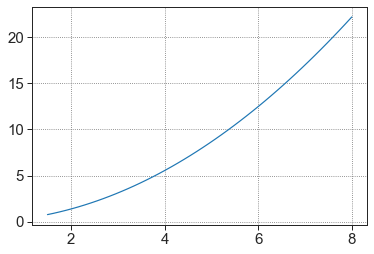

In [16]:
x = np.linspace(1.5, 8, 50)
plt.plot(x,  (0.003467 * x**2)*100)

In [12]:
np.linspace(*action_set[0],50)

array([ 0.        ,  0.23408163,  0.46816327,  0.7022449 ,  0.93632653,
        1.17040816,  1.4044898 ,  1.63857143,  1.87265306,  2.10673469,
        2.34081633,  2.57489796,  2.80897959,  3.04306122,  3.27714286,
        3.51122449,  3.74530612,  3.97938776,  4.21346939,  4.44755102,
        4.68163265,  4.91571429,  5.14979592,  5.38387755,  5.61795918,
        5.85204082,  6.08612245,  6.32020408,  6.55428571,  6.78836735,
        7.02244898,  7.25653061,  7.49061224,  7.72469388,  7.95877551,
        8.19285714,  8.42693878,  8.66102041,  8.89510204,  9.12918367,
        9.36326531,  9.59734694,  9.83142857, 10.0655102 , 10.29959184,
       10.53367347, 10.7677551 , 11.00183673, 11.23591837, 11.47      ])

In [25]:
from IPython.display import display

a = widgets.IntSlider(description='a')
b = widgets.IntSlider(description='b')
c = widgets.IntSlider(description='c')


def f(a, b, c):
    print('{}*{}*{}={}'.format(a, b, c, a*b*c))

def f2(a, b, c):
   print(Markdown('${}\\times{}\\times{}={}$'.format(a, b, c, a*b*c)))

def f3(a, b, c):
   display(Markdown('${}\\times{}\\times{}={}$'.format(a, b, c, a*b*c)))
out = widgets.interactive_output(f3, {'a': a, 'b': b, 'c': c})

widgets.HBox([widgets.HTMLMath(r'u_1(x,a) = {}a_1^2 + {}a_1 + {} - ({}\theta_{{AT}}^2 + {}\theta_{{AT}} + {})'.format(beta_2_1, beta_1_1, beta_0_1, gamma_2, gamma_1, gamma_0)), out])

NameError: name 'beta_2_1' is not defined

In [38]:
from itertools import product

names = ['p1', 'p2']
action_set = np.vstack((ACTION_SETS[0], np.sum(ACTION_SETS[1:], axis=0)*2)) 
Gdp = np.vstack((GDP_MAX[0], np.sum(GDP_MAX[1:], axis=0)))

percentage = np.linspace(0,1,50)
tuple_percentage = [percentage * ub for ub in action_set[:,1]]
product_strategy = product(*tuple_percentage)

list_product_strategy = np.array([list(x) for x in product_strategy], ndmin=3)
list_product_strategy_profile = np.moveaxis(np.moveaxis(np.repeat(list_product_strategy, repeats=T, axis=0), [0,1,2],[1,0,2]), [0,1,2], [0,2,1])
print(list_product_strategy_profile.shape)
action_1 = np.array(list(product(percentage*action_set)))
print(action_1.shape)
sum_list_product_strategy_profile = np.sum(list_product_strategy_profile, axis = 1)
print(sum_list_product_strategy_profile.shape)


(2500, 2, 17)


ValueError: operands could not be broadcast together with shapes (50,) (2,2) 

In [39]:
import random 

num_sample = 500
percentage = np.linspace(0,1,2,endpoint=True)
tuple_percentage = [percentage * ub for ub in action_set[:,1]]
product_strategy = product(*tuple_percentage)
list_product_strategy = [list(x) for x in product_strategy]
random_product = []
for k in tqdm(range(num_sample), desc='Sampling'):
    random_product.append(random.choices(list_product_strategy, k= T))
random_product = np.array(random_product)
list_product_strategy_profile_1 = np.moveaxis(random_product, [0,1,2], [0,2,1])
sum_list_product_strategy_profile_1 = np.sum(list_product_strategy_profile_1, axis = 1)


Sampling: 100%|██████████| 500/500 [00:00<00:00, 483995.38it/s]


In [39]:
names = ['p1', 'p2']
action_set = np.vstack((ACTION_SETS[0], np.sum(ACTION_SETS[1:], axis=0)*2)) 
Gdp = np.vstack((GDP_MAX[0], np.sum(GDP_MAX[1:], axis=0)))
@widgets.interact( beta_0_1=FloatSlider(min= -10, max= 10, step = 0.1, name=r'$\beta_{0,1}$',  description_allow_html=True),
                   beta_1_1=0.2, # (-10,10,0.1),
                    beta_2_1= -0.005, #(-1,1,0.005),
                    beta_0_2=(-10,10,0.1),
                    beta_1_2=0.6, # -10,10,0.1),
                    beta_2_2= -.005, #(-1,1,0.005),
                    w_1=(0,10,0.1), w_2=(0,10,0.1),
                          gamma_0=(-10,10,0.1), gamma_1=(-10,10,0.1), gamma_2=(0,10,0.001),gamma_3=(-10,10,0.1),
                        carbon_multiplier = (1,5,0.5), temp_multiplier = (1,5,0.5))
def game_two_player(beta_0_1, beta_1_1, beta_2_1, beta_0_2, beta_1_2, beta_2_2, w_1, w_2, gamma_0, gamma_1, gamma_2, gamma_3):
    list_benefit_functions = [partial(benefit_polynome, coef=[beta_0_1, beta_1_1, beta_2_1]), partial(benefit_polynome, coef=[beta_0_2, beta_1_2, beta_2_2])]
    damage_coef = [gamma_0, gamma_1, gamma_2, gamma_3]
    list_deltas = [w_1, w_2]
    list_players = create_players(list_of_names=names, list_action_sets=action_set, list_GDP_initial=Gdp,
                                   list_deltas=list_deltas, list_benefit_functions=list_benefit_functions,
                                   list_coef_increase_co2 = [0,0], list_percentage_green = [0,0], damage_in_percentage= False,
                                       damage_function=damage_polynome(damage_coef), discount=1)


    game = Game(list_players, horizon=2100)
    utilities = np.array([0,0])
    utilities_front = np.array([0,0])

    for action, sum_action in zip(list_product_strategy_profile_1, sum_list_product_strategy_profile_1):
           utilities = np.vstack((utilities, game.planning_game_with_strategies_profile(array_action=action, sum_action= sum_action)))
    
    for action, sum_action in zip(list_product_strategy_profile, sum_list_product_strategy_profile):
           utilities = np.vstack((utilities, game.planning_game_with_strategies_profile(array_action=action, sum_action= sum_action)))    

    # for action in random_product:
    #        utilities_front = np.vstack((utilities_front,game.planning_game_pareto_front(action) ))
    game.planning_BRD()
    game.reset()
    game.planning_SO()
    # display(Markdown(r'u_1(x,a) = {}a_1^2 + {}a_1 + {} - ({}\theta_{{AT}}^2 + {}\theta_{{AT}} + {})'.format(beta_2_1, beta_1_1, beta_0_1, gamma_2, gamma_1, gamma_0)))
    print('NE : ', game.ne_a_planning_brd)
    print('NE sum utilities :', np.sum(game.ne_sum_u_planning_brd))
    # print(2 * beta_2_1 *np.linspace(*action_set[0],100, endpoint=True) + beta_1_1)
    # print(2 * beta_2_2 *np.linspace(*action_set[1],100, endpoint=True) + beta_1_2)

    ne_1, ne_2 = game.ne_u_planning_brd

    so_1, so_2 = game.so_u_planning
    print('SO : ',game.so_a_planning)
    print('SO sum utilities :', np.sum(game.so_sum_u_planning))


    if (2 * beta_2_1 * action_set[0,1] + beta_1_1) < 0 or  (2 * beta_2_2 * action_set[1,1] + beta_1_2) < 0 :
        plt.scatter(utilities[1:,0],utilities[1:,1], marker='.', color='red' )

    else :
        plt.scatter(utilities[1:,0],utilities[1:,1])

    print(utilities.shape)
    # plt.scatter(utilities_front[1:,0],utilities_front[1:,1], marker='.', color='black' )

    # plt.contour(utilities[1:,0],utilities[1:,1])
    plt.scatter(np.sum(ne_1), np.sum(ne_2), marker='X' )
    plt.scatter(np.sum(so_1), np.sum(so_2), marker='s', color='black' )

    argmax = np.argmax(np.sum(utilities[1:,:], axis=1)) +1
    # print(argmax)
    # print('Random max :', list_product_strategy_profile_1[argmax] )
    # game.planning_SO(x0 = list_product_strategy_profile_1[argmax])
    # so_1, so_2 = game.so_u_planning
    # print('SO : ',game.so_a_planning)
    # print('SO sum utilities :', np.sum(game.so_sum_u_planning))
    # plt.scatter(np.sum(so_1), np.sum(so_2), marker='+', color='black' )


    print('Random max utility :', sum(utilities[argmax]))
    plt.scatter(utilities[argmax,0], utilities[argmax,1], color='purple')
    plt.axis('equal')



interactive(children=(FloatSlider(value=0.0, description='beta_0_1', max=10.0, min=-10.0), FloatSlider(value=0…

In [32]:
actions = np.array([[ 6.08612245,  4.91571429,  2.57489796,  6.78836735,  4.44755102,  8.89510204,
   9.12918367,  4.91571429,  4.44755102,  3.27714286, 10.53367347,  1.4044898,
   7.95877551,  6.78836735,  1.63857143, 11.23591837,  1.87265306],
 [44.79428571, 45.86081633,  4.26612245,  6.39918367, 11.73183673, 18.13102041,
  17.0644898,  47.99387755, 50.12693878, 49.06040816, 20.26408163, 26.66326531,
  13.86489796, 45.86081633, 42.66122449, 45.86081633, 39.46163265]])

In [17]:
actions[0]

array([ 6.08612245,  4.91571429,  2.57489796,  6.78836735,  4.44755102,
        8.89510204,  9.12918367,  4.91571429,  4.44755102,  3.27714286,
       10.53367347,  1.4044898 ,  7.95877551,  6.78836735,  1.63857143,
       11.23591837,  1.87265306])

In [14]:
list_product_strategy_profile_1[0]

array([[ 6.32020408,  9.36326531,  2.34081633,  0.7022449 ,  1.17040816,
         9.59734694,  9.12918367,  9.36326531,  1.17040816, 10.29959184,
         8.19285714, 11.23591837,  2.57489796,  5.85204082,  6.55428571,
         7.72469388,  5.85204082],
       [24.53020408, 29.86285714, 29.86285714, 35.1955102 , 37.32857143,
        24.53020408,  7.46571429, 49.06040816, 33.06244898, 21.33061224,
        34.12897959,  6.39918367, 37.32857143, 14.93142857,  3.19959184,
        42.66122449, 35.1955102 ]])

In [15]:
sum_list_product_strategy_profile_1[0]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [42]:
!pip install optuna

Defaulting to user installation because normal site-packages is not writeable


In [2]:
import optuna
optuna.logging.set_verbosity(optuna.logging.WARNING)

import plotly.graph_objects as go

import numpy as np 
from scipy.optimize import *

import matplotlib.pyplot as plt
import seaborn as sns

from parameters import *
from models.game_theory_model import *
from models.game import *
from plot_function import *
from ipywidgets import interact, interactive, fixed, interact_manual
from ipywidgets import *
import ipywidgets as widgets
from functools import partial
from IPython.display import display, Math, Latex
from tqdm import tqdm
from scipy.spatial import ConvexHull
from termcolor import colored

In [2]:
scm = SCM

In [40]:
names = ['p1', 'p2']
action_set = np.vstack((ACTION_SETS[0], np.sum(ACTION_SETS[1:], axis=0)*2)) 
Gdp = np.vstack((GDP_MAX[0], np.sum(GDP_MAX[1:], axis=0)))
@widgets.interact( beta_0_1=FloatSlider(min= -10, max= 10, step = 0.1, name=r'$\beta_{0,1}$',  description_allow_html=True), beta_1_1=0.2, beta_2_1=-0.005,
                          beta_0_2=(-10,10,0.1), beta_1_2=0.6, beta_2_2=-0.005,
                          w_1=(0,10,0.1), w_2=(0,10,0.1),
                          gamma_0=(-10,10,0.1), gamma_1=(-10,10,0.1), gamma_2=1.145,gamma_3=(-10,10,0.1),
                        carbon_multiplier = (1,5,0.5), temp_multiplier = (1,5,0.5))
def game_two_player(beta_0_1, beta_1_1, beta_2_1, beta_0_2, beta_1_2, beta_2_2, w_1, w_2, gamma_0, gamma_1, gamma_2, gamma_3):
    list_benefit_functions = [partial(benefit_polynome, coef=[beta_0_1, beta_1_1, beta_2_1]), partial(benefit_polynome, coef=[beta_0_2, beta_1_2, beta_2_2])]
    damage_coef = [gamma_0, gamma_1, gamma_2, gamma_3]
    list_deltas = [w_1, w_2]
    list_players = create_players(list_of_names=names, list_action_sets=action_set, list_GDP_initial=Gdp,
                                   list_deltas=list_deltas, list_benefit_functions=list_benefit_functions,
                                   list_coef_increase_co2 = [0,0], list_percentage_green = [0,0], damage_in_percentage= False,
                                       damage_function=damage_polynome(damage_coef), discount=1)


    game = Game(list_players, horizon=2020)
    utilities = np.array([0,0])

    player1 = list_players[0]
    player2 = list_players[1]
    def objective(trial):
        x = []
        y = []
        for t in range(17):
            x.append(trial.suggest_float("x{}".format(t), 1, action_set[0,1], step = 1))
            y.append(trial.suggest_float("y{}".format(t), 1, action_set[1,1], step = 1))
        
        x = np.array(x)
        y = np.array(y)


        v0 = player1.utility_sum_over_t(x,y)
        v1 = player2.utility_sum_over_t(y,x)
        return v0, v1

    study = optuna.create_study(directions=["maximize", "maximize"], sampler=optuna.samplers.TPESampler())
    study.optimize(objective, n_trials=300, show_progress_bar=True, timeout=60)
    
    fig = optuna.visualization.plot_pareto_front(study)
    fig.show()

interactive(children=(FloatSlider(value=0.0, description='beta_0_1', max=10.0, min=-10.0), FloatSlider(value=0…

In [16]:
def objective(trial):
    # The following suggest method specifies integer points between -5 and 5.
    x = trial.suggest_float("x", -5.0, 5.0, step=0.1)
    y = trial.suggest_float("y", -5.0, 5.0, step=0.01)

    return x**2 + y**3, x**3 + y**2


# Non-int points are specified in the grid.
search_space = {"x": [-0.5,0, 0.5], "y": [-0.5,0,  1]}
study = optuna.create_study(directions=["minimize", "maximize"], sampler=optuna.samplers.RandomSampler())
study.optimize(objective, n_trials=2000)
fig = optuna.visualization.plot_pareto_front(study)
fig.show()

In [42]:
names = ['p1', 'p2']
action_set = np.vstack((ACTION_SETS[0], np.sum(ACTION_SETS[1:], axis=0)*2)) 
Gdp = np.vstack((GDP_MAX[0], np.sum(GDP_MAX[1:], axis=0)))


def objective(trial):
    list_benefit_functions = [partial(benefit_polynome, coef=[5, trial.suggest_float("b01", 0.1,1), trial.suggest_float("b02", -1,-0.002)]), partial(benefit_polynome, coef=[5, trial.suggest_float("b11", 0.1,1), trial.suggest_float("b12", -1,-0.002)])]
    damage_coef = [0, 0, trial.suggest_float("g2", 0.1,1), trial.suggest_float("g3",0.002,0.02)]
    list_deltas = [1, 1]
    list_players = create_players(list_of_names=names, list_action_sets=action_set, list_GDP_initial=Gdp,
                                   list_deltas=list_deltas, list_benefit_functions=list_benefit_functions,
                                   list_coef_increase_co2 = [0,0], list_percentage_green = [0,0], damage_in_percentage= False,
                                       damage_function=damage_polynome(damage_coef), discount=1)


    player1 = list_players[0]
    player2 = list_players[1]


    x = list_product_strategy_profile_1[0,0]
    y = list_product_strategy_profile_1[0,1]
    

    v0 = player1.utility_sum_over_t(x,y)
    v1 = player2.utility_sum_over_t(y,x)
    return v0, v1

study = optuna.create_study(directions=["maximize", "maximize"], sampler=optuna.samplers.TPESampler())
study.optimize(objective, n_trials=300, show_progress_bar=True, timeout=60)

fig = optuna.visualization.plot_pareto_front(study)
fig.show()

C:\Users\Anthony Couthures\AppData\Roaming\Python\Python39\site-packages\optuna\progress_bar.py:56: ExperimentalWarning:

Progress bar is experimental (supported from v1.2.0). The interface can change in the future.



  0%|          | 0/300 [00:00<?, ?it/s]

In [49]:
names = ['p1', 'p2']
action_set = np.vstack((ACTION_SETS[0], np.sum(ACTION_SETS[1:], axis=0)*2)) 
Gdp = np.vstack((GDP_MAX[0], np.sum(GDP_MAX[1:], axis=0)))
@widgets.interact( beta_0_1=FloatSlider(min= -10, max= 10, step = 0.1, name=r'$\beta_{0,1}$',  description_allow_html=True), beta_1_1=0.2, beta_2_1=-0.005,
                          beta_0_2=(-10,10,0.1), beta_1_2=0.6, beta_2_2=-0.005,
                          w_1=(0,10,0.1), w_2=(0,10,0.1),
                          gamma_0=(-10,10,0.1), gamma_1=(-10,10,0.1), gamma_2=1.145,gamma_3=(-10,10,0.1),
                        carbon_multiplier = (1,5,0.5), temp_multiplier = (1,5,0.5))
def game_two_player(beta_0_1, beta_1_1, beta_2_1, beta_0_2, beta_1_2, beta_2_2, w_1, w_2, gamma_0, gamma_1, gamma_2, gamma_3):
    list_benefit_functions = [partial(benefit_polynome, coef=[beta_0_1, beta_1_1, beta_2_1]), partial(benefit_polynome, coef=[beta_0_2, beta_1_2, beta_2_2])]
    damage_coef = [gamma_0, gamma_1, gamma_2, gamma_3]
    list_deltas = [w_1, w_2]
    list_players = create_players(list_of_names=names, list_action_sets=action_set, list_GDP_initial=Gdp,
                                   list_deltas=list_deltas, list_benefit_functions=list_benefit_functions,
                                   list_coef_increase_co2 = [0,0], list_percentage_green = [0,0], damage_in_percentage= False,
                                       damage_function=damage_polynome(damage_coef), discount=1)


    game = Game(list_players, horizon=2020)
    utilities = np.array([0,0])

    player1 = list_players[0]
    player2 = list_players[1]
    def objective(trial):
        x = trial.suggest_float("x{}".format(t),0, action_set[0,1], step = 0.1)
        y = trial.suggest_float("y{}".format(t), 0, action_set[1,1], step = 0.1)
        



        v0 = player1.utility_sum_over_t(x,y)
        v1 = player2.utility_sum_over_t(y,x)
        return v0, v1

    study = optuna.create_study(directions=["maximize", "maximize"], sampler=optuna.samplers.RandomSampler())
    study.optimize(objective, n_trials=5000, show_progress_bar=True)
    
    fig = optuna.visualization.plot_pareto_front(study)
    fig.show()

interactive(children=(FloatSlider(value=0.0, description='beta_0_1', max=10.0, min=-10.0), FloatSlider(value=0…